# Assignment 3

### Imports

In [1]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import nltk
import spacy
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from wordcloud import WordCloud
from gensim.models import Phrases, LdaMulticore, CoherenceModel
from gensim.corpora import Dictionary
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.cluster import HDBSCAN
from umap import UMAP


/Users/easonwang/anaconda3/lib/python3.11/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
/Users/easonwang/anaconda3/lib/python3.11/site-packages/plotly/express/imshow_utils.py:24: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  np.bool8: (False, True),
/Users/easonwang/anaconda3/lib/python3.11/site-packages/plotly/graph_objs/__init__.py:288: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(ipywidgets.__version__) >= LooseVersion("7.0.0"):
/Users/easonwang/anaconda3/lib/python3.11/site-packages/plotly/graph_objs/__init__.py:288: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(ipywid

In [2]:
stop_words = nltk.corpus.stopwords.words('english')
nlp = spacy.load("en_core_web_md", disable=["parser", "ner"])

### 1.Load Dataset

In [3]:
url = "https://storage.googleapis.com/adsp-nlp-open/data/nlp_a_6_news.json"
news_df = pd.read_json(url, orient="records", lines=True).sample(n=5000, random_state=0)

In [4]:
news_df

,url,date,language,title,text
3844,https://www.kxii.com/prnewswire/2022/05/23/com...,2022-05-23,en,COMPUTEX 2022 Global Press Conference Industry...,COMPUTEX 2022 Global Press Conference Industry...
3617,https://www.bigrapidsnews.com/business/article...,2022-06-09,en,"Moderna, Roku rise; Scotts Miracle-Gro, Charle...","Moderna, Roku rise; Scotts Miracle-Gro, Charle..."
2608,https://www.devdiscourse.com/article/education...,2022-04-12,en,Create entrepreneurship ecosystem in districts...,Create entrepreneurship ecosystem in districts...
3857,https://www.seattletimes.com/seattle-news/heal...,2022-04-30,en,Connecticut Senate OKs bill that protects abor...,Connecticut Senate OKs bill that protects abor...
1595,https://www.breakinglatest.news/news/maturity-...,2022-07-24,en,"Maturity, thanks from Fabio and Adriana: “Incl...","Maturity, thanks from Fabio and Adriana: “Incl..."
...,...,...,...,...,...
4397,https://www.benzinga.com/quote/ODP,2022-02-24,en,"ODP (NASDAQ:ODP) Stock Price, News, Charts - B...","ODP (NASDAQ:ODP) Stock Price, News, Charts - B..."
8697,https://gadgets360.com/mobiles/news/motorola-m...,2022-02-17,en,"Moto G22 Price, Specifications Leak; MediaTek ...","Moto G22 Price, Specifications Leak; M..."
5873,https://www.seattletimes.com/sports/boston-lea...,2022-01-28,en,Boston leads No. 1 South Carolina to 69-40 win...,Boston leads No. 1 South Carolina to 69-40 win...
6123,https://www.thenationalnews.com/business/marke...,2022-07-20,en,"Netflix loses 970,000 subscribers but quarterl...","Netflix loses 970,000 subscribers but quarterl..."


In [8]:
news_df['text'][1]

'MAI TT WEDS newsdzeZimbabweNewsdzeZimbabweskip to main  |      skip to sidebarHomeAboutContactAdvertiseNewsdzeZimbabweOur Zimbabwe Our NewsHomeNewsBusinessEntertainmentSaturday, 9 April 2022MAI TT WEDSSaturday, April 09, 2022 \xa0NewsdzeZimbabwe \xa0 0\xa0Best moments... @Chakariboy @NyamayaroArron @restmutore @Lattynyangu pic.twitter.com/MsrhcFXUJj— H-Metro (@HMetro_) April 9, 2022 Posted in:  Share to TwitterShare to FacebookOlder PostHome0comments:        Post a CommentFollow NewsdzeZimbabweRecent CommentsPowered by DisqusFollow NewsdzeZimbabwePopular PostsTYCOON BEDS MOTHER AND DAUGHTERA woman from Bulawayo was left shocked and heartbroken after discovering that her husband — a local businessman has been double-crossing her...PUPIL STUMBLES ON GOLD ORE IN A CAVE : 10 000 MAKOROKOZA DESCEND ON KWEKWESome 10 000 artisanal miners swarmed Kwekwe on Saturday last week after a Grade 6 pupil at Amaveni Primary School picked a piece of gold ore...HOOKER UNDRESSES IN PUBLIC IN HARAREA WOMA

### 2.Text Preprocessing

In [10]:
def clean_text(corpus, spacy_pipeline, as_string=False, n_proc=2, batch_size=1000):
    cleaned_corpus = []
    for doc in spacy_pipeline.pipe(corpus, batch_size=batch_size, n_process=n_proc):
        tokens = [
            token.lemma_.lower()
            for token in doc
            if not token.is_stop and token.is_alpha and len(token) > 1 and token.pos_ in ("NOUN", "VERB")
        ]
        if as_string:
            cleaned_corpus.append(" ".join(tokens))
        else:
            cleaned_corpus.append(tokens)
    return cleaned_corpus

tokenized_texts = clean_text(news_df['text'].tolist(), spacy_pipeline=nlp)
## too slow, used fast_preprocess instead

/Users/easonwang/anaconda3/lib/python3.11/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
/Users/easonwang/anaconda3/lib/python3.11/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


In [4]:
def fast_preprocess(texts):
    return [
        [token.lower() for token in re.findall(r'\b[a-z]{3,}\b', doc.lower())
         if token not in stop_words]
        for doc in texts
    ]
tokenized_texts = fast_preprocess(news_df['text'])

In [6]:
tokens_wide_df = pd.DataFrame(tokenized_texts)

In [7]:
tokens_wide_df

,0,1,2,3,4,5,6,7,8,9,...,54640,54641,54642,54643,54644,54645,54646,54647,54648,54649
0,computex,global,press,conference,industry,leaders,gather,unlock,future,trendsskip,...,None,None,None,None,None,None,None,None,None,None
1,moderna,roku,rise,scotts,miracle,gro,charles,river,fall,skip,...,None,None,None,None,None,None,None,None,None,None
2,create,entrepreneurship,ecosystem,districts,drive,local,jobs,taka,task,force,...,None,None,None,None,None,None,None,None,None,None
3,connecticut,senate,oks,bill,protects,abortion,providers,seattle,times,skip,...,None,None,None,None,None,None,None,None,None,None
4,maturity,thanks,fabio,adriana,inclusion,put,practice,every,day,alessandro,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,odp,nasdaq,odp,stock,price,news,charts,benzingamy,accountmy,accountlog,...,None,None,None,None,None,None,None,None,None,None
4996,moto,price,specifications,leak,mediatek,helio,soc,triple,rear,cameras,...,None,None,None,None,None,None,None,None,None,None
4997,boston,leads,south,carolina,win,ole,miss,seattle,times,skip,...,None,None,None,None,None,None,None,None,None,None
4998,netflix,loses,subscribers,quarterly,profit,jumpswednesday,july,circle,red,arrow,...,None,None,None,None,None,None,None,None,None,None


### 3.LDA Topic Modeling
- **Topic numbers tested**: 3, 6, 9
- **Selection method**: Coherence Score (`c_v`)
- **Visualization**: Line plot of coherence vs. number of topics  
- **Best model**: **9 topics**, selected based on the highest coherence score

In [8]:
# Add bigrams
bigram = Phrases(tokenized_texts, min_count=5, threshold=100)
tokenized_bigrams = [bigram[doc] for doc in tokenized_texts]

# Create dictionary and corpus
dictionary = Dictionary(tokenized_bigrams)
dictionary.filter_extremes(no_below=10, no_above=0.5)
corpus = [dictionary.doc2bow(text) for text in tokenized_bigrams]

In [9]:
corpus

[[(0, 1),
  (1, 3),
  (2, 1),
  (3, 1),
  (4, 2),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 2),
  (20, 1),
  (21, 3),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 2),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 2),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 2),
  (38, 1),
  (39, 3),
  (40, 1),
  (41, 5),
  (42, 1),
  (43, 2),
  (44, 1),
  (45, 1),
  (46, 4),
  (47, 1),
  (48, 4),
  (49, 3),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 4),
  (54, 1),
  (55, 3),
  (56, 3),
  (57, 5),
  (58, 15),
  (59, 4),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 2),
  (64, 1),
  (65, 2),
  (66, 2),
  (67, 1),
  (68, 1),
  (69, 3),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 2),
  (78, 1),
  (79, 2),
  (80, 1),
  (81, 5),
  (82, 1),
  (83, 1),
  (84, 5),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 1),
  (90, 1),
  (91, 1

In [11]:
# Select optimal number of topics using coherence score
topic_range = range(3, 12, 3)
coherence_scores = []
models = []

for num_topics in topic_range:
    lda = LdaMulticore(
        corpus=corpus,
        id2word=dictionary,
        num_topics=num_topics,
        passes=10,
        workers=2,
        random_state=42
    )
    cm = CoherenceModel(model=lda, texts=tokenized_bigrams, dictionary=dictionary, coherence='c_v')
    coherence_scores.append(cm.get_coherence())
    models.append(lda)


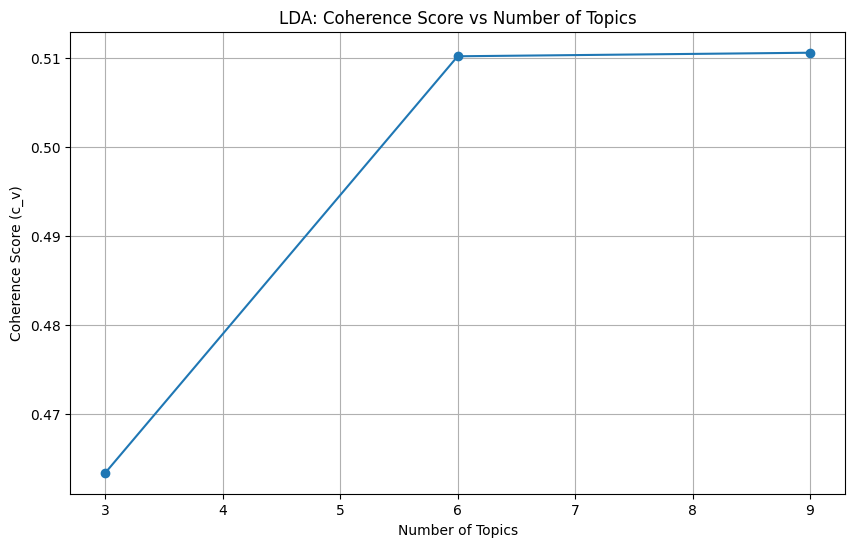

In [12]:
# Plot coherence score
plt.figure(figsize=(10, 6))
plt.plot(topic_range, coherence_scores, marker='o')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score (c_v)")
plt.title("LDA: Coherence Score vs Number of Topics")
plt.grid(True)
plt.show()

In [13]:
# Select best model
best_index = np.argmax(coherence_scores)
best_lda_model = models[best_index]
print(f"Selected {best_lda_model.num_topics} topics for LDA")

Selected 9 topics for LDA


In [14]:
# Display LDA topics
for idx, topic in best_lda_model.print_topics(-1):
    print(f"Topic {idx}: {topic}")

# LDA Visualization
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(best_lda_model, corpus, dictionary)
pyLDAvis.display(vis)

Topic 0: 0.018*"market" + 0.008*"data" + 0.006*"cloud" + 0.006*"global" + 0.006*"business" + 0.005*"growth" + 0.005*"report" + 0.005*"opens" + 0.005*"website" + 0.004*"information"
Topic 1: 0.019*"people" + 0.013*"link_opens" + 0.011*"tab" + 0.008*"equities" + 0.007*"music" + 0.007*"account" + 0.006*"width" + 0.006*"profile" + 0.005*"data" + 0.005*"social"
Topic 2: 0.043*"video" + 0.037*"music" + 0.035*"official" + 0.011*"oakland" + 0.009*"song" + 0.006*"covid" + 0.006*"black_history" + 0.005*"nfl" + 0.005*"super_bowl" + 0.005*"georgia"
Topic 3: 0.010*"state" + 0.009*"federal" + 0.006*"washington" + 0.006*"county" + 0.005*"covid" + 0.005*"week" + 0.005*"tuesday" + 0.005*"area" + 0.004*"biden" + 0.004*"texas"
Topic 4: 0.010*"stock" + 0.008*"shares" + 0.007*"inc" + 0.006*"market" + 0.006*"stocks" + 0.005*"price" + 0.004*"billion" + 0.004*"quarter" + 0.003*"nasdaq" + 0.003*"million"
Topic 5: 0.005*"star" + 0.004*"says" + 0.004*"black" + 0.003*"reveals" + 0.003*"show" + 0.003*"two" + 0.003

### LDA Topic Labels & Interpretation

| Topic | Top Keywords | Assigned Label |
|-------|--------------|----------------|
| 0 | market, data, cloud, global, business | **Global Business & Cloud** |
| 1 | people, profile, social, link_opens | **Social Media & Profiles** |
| 2 | video, music, official, nfl, covid | **Entertainment & Sports** |
| 3 | state, federal, covid, biden, texas | **U.S. Government & Policy** |
| 4 | stock, shares, market, price, inc | **Stock Market & Finance** |
| 5 | star, show, family, years, black | **Celebrities & Pop Culture** |
| 6 | jpg, resize, https, file, quality | **Image Metadata (Noise)** |
| 7 | arm, azure, email, group, nfl | **Technology Infrastructure** |
| 8 | use, ago, days, apple, game | **General Consumer News** |

Topic names were derived from the top keywords and manually verified by inspecting representative articles.

To ensure the **topic labels are meaningful**, we relied on two forms of evidence:

#### Top Keywords per Topic
Each topic was analyzed using its **top 10 weighted keywords**, which represent the most probable words associated with that topic. These keywords clearly signal the underlying theme of each cluster.

Example – **LDA Topic 2**:
- **Top Keywords**: `video`, `music`, `official`, `oakland`, `song`, `covid`, `black_history`, `nfl`, `super_bowl`
- **Label Assigned**: **Entertainment & Sports**
- **Justification**: The presence of terms like `music`, `song`, `official`, `nfl`, and `super_bowl` strongly indicates this topic is about entertainment media and major sports events.


#### Representative Documents

We examined randomly sampled documents with **high topic probability** (i.e., documents where the model assigns >70% of their content to a single topic). This supports qualitative validation of the themes.

Example – **LDA Topic 4**:
- **Top Keywords**: `stock`, `shares`, `inc`, `market`, `price`, `nasdaq`
- **Label Assigned**: **Stock Market & Finance**
- **Representative Document Excerpt**:
  > *"Apple shares rose by 5% in early trading following the company’s strong quarterly earnings report. Analysts forecast further gains across the tech sector."*
- **Justification**: Strong alignment with terms like `shares`, `price`, `quarter`, and stock exchange terminology.


### 4.BERTopic Modeling
- **Topic number**: Automatically inferred via **HDBSCAN** clustering
- **Dimensionality reduction**: UMAP (`n_components=5`)
- **Final topic count**: ~60 (including noise)

In [16]:
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
sampled_texts = news_df["text"]

umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom')

bertopic = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=True
)
topics, probs = bertopic.fit_transform(sampled_texts)

2025-04-12 18:28:52,672 - BERTopic - Embedding - Transforming documents to embeddings.
/Users/easonwang/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/Users/easonwang/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/Users/easonwang/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/Users/easonwang/anaconda

Batches:   0%|          | 0/157 [00:00<?, ?it/s]

2025-04-12 18:29:26,011 - BERTopic - Embedding - Completed ✓
2025-04-12 18:29:26,011 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-12 18:29:31,600 - BERTopic - Dimensionality - Completed ✓
2025-04-12 18:29:31,601 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-12 18:29:31,685 - BERTopic - Cluster - Completed ✓
2025-04-12 18:29:31,687 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-12 18:29:34,573 - BERTopic - Representation - Completed ✓


In [18]:
# Show topic summary
bertopic.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1435,-1_jpg_resize_https_strip,"[jpg, resize, https, strip, 85, quality, media...",[Biden y López Obrador tendrán una reunión vir...
1,0,327,0_the_seattle_times_to,"[the, seattle, times, to, in, said, of, and, t...",[AP Week in Pictures: Asia | The Seattle Times...
2,1,256,1_and_of_the_prnewswire,"[and, of, the, prnewswire, gray, to, with, in,...",[CRN Recognizes Informatica as a Cloud 100 Com...
3,2,216,2_to_as_in_of,"[to, as, in, of, for, on, markets, the, inflat...",[ Global Money Trickles Back Into Most Unlov...
4,3,207,3_days_the_of_to,"[days, the, of, to, and, that, is, in, it, you]",[iPhone sales falter in the world's top smartp...
...,...,...,...,...,...
56,55,16,55_traded_btc_dollar_trades,"[traded, btc, dollar, trades, against, or, exc...",[Seedify.fund One Day Volume Reaches $4.81 Mil...
57,56,15,56_investorsobserver_lp_options_prnumber,"[investorsobserver, lp, options, prnumber, pr,...",[Thinking about trading options or stock in Ap...
58,57,15,57_usd_eur_fxstreet_jpy,"[usd, eur, fxstreet, jpy, gbp, forex, dollar, ...",[ ...
59,58,15,58_cloud_and_data_to,"[cloud, and, data, to, services, the, business...",[The cloud is too big for one winner - ARNARN ...


In [19]:
# Visualize topics
bertopic.visualize_barchart(top_n_topics=10)
bertopic.visualize_topics()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/Users/easonwang/anaconda3/lib/python3.11/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

/Users/easonwang/anaconda3/lib/python3.11/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### BERTopic Labels & Interpretation (Selected Topics)

| Topic | Top Words | Assigned Label |
|-------|-----------|----------------|
| 1 | prnewswire, company, cloud | **Enterprise Cloud & PR** |
| 2 | markets, inflation, stocks | **Global Finance Trends** |
| 55 | btc, traded, exchange | **Cryptocurrency Trading** |
| 59 | terra, africa, silence | **Blockchain & Geopolitics** |

BERTopic uses dense semantic embeddings to discover fine-grained themes, including domain-specific niches.


BERTopic provides not only top words but also **representative documents per topic**, which we reviewed.

Example – **BERTopic Topic 55**:
- **Top Words**: `btc`, `traded`, `dollar`, `exchange`, `volume`
- **Label**: **Cryptocurrency Trading**
- **Representative Doc**:
  > *"Seedify.fund One Day Volume Reaches $4.81 Million as BTC Prices Recover."*
- **Justification**: Clear focus on crypto exchanges, trading volume, and tokens.

## Summary

LDA is highly effective for structured corpora and excels in interpretability. Its reliance on word co-occurrence leads to thematically broad but well-separated topics, making it especially suitable for news, reports, and documents where explainability is essential. In this project, LDA produced nine clear topics such as “Stock Market & Finance” or “Entertainment & Sports,” with labels assigned based on top keywords and representative document samples. The number of topics was manually optimized using coherence scores, which offered an objective measure of model quality.

In contrast, BERTopic leverages semantic embeddings and unsupervised clustering to uncover more nuanced, fine-grained, and domain-specific topics. It automatically identified around 60 topics, including niche areas like “Cryptocurrency Trading” and “Enterprise Cloud PR” that LDA did not isolate as distinctly. BERTopic's strength lies in its ability to group semantically similar texts even if they don’t share surface-level vocabulary, making it ideal for messy or short-form content. While LDA yields compact and interpretable outputs, BERTopic reveals deeper structures and emerging themes—providing complementary strengths for different analysis goals.